In [2]:
import numpy as np
import scipy
import h5py
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

from simulation_data import get
from simulation_data.galaxies import GalaxyPopulation
my_galaxy_population = GalaxyPopulation()
from simulation_data.galaxies.galaxy import age_profile, get_star_formation_history, get_galaxy_particle_data, get_stellar_assembly_data, metallicity_profile, metals_profile

Load pre-calculated data from file: ```galaxy_population_data_2.hdf5``` for faster execution.

In [3]:
with h5py.File('galaxy_population_data_'+str(2)+'.hdf5', 'r') as f:
    ids = f['ids'][:]
    median_age = f['median_age'][:]
    halfmass_radius = f['halfmass_radius'][:]
    total_mass = f['total_mass'][:]
    halflight_radius_U = f['halflight_radius_U'][:]
    halflight_radius_V = f['halflight_radius_V'][:]
    halflight_radius_I = f['halflight_radius_I'][:]
    newbin_current_SFR = f['newbin_current_SFR'][:]
    maximum_merger_ratio_30kpc_current_fraction = f['maximum_merger_ratio_30kpc_current_fraction'][:]

Now apply the selection criteria for star-forming, young quiescent (post-starburst), intermediate, and old quiescent galaxies at $z=2$.

In [4]:
import warnings
warnings.filterwarnings('ignore')

PSB_selection = (median_age<=1.2)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
intermediate_quiescent_selection = (median_age>1.2)&(median_age<=1.5)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
old_quiescent_selection = (median_age>1.5)&(np.log10(newbin_current_SFR/10**(total_mass))<=-10.5)
starforming_selection = (np.log10(newbin_current_SFR/10**(total_mass))>-10.5)

### Figure 1 (test figure)

Star formation histories for the four galaxy populations. For the star-forming population we only show 80 randomly drawn galaxies, for clarity.  The curves are binned over 100 Myr and normalized by the total mass formed.  In each panel a bold curve marks the median trend.

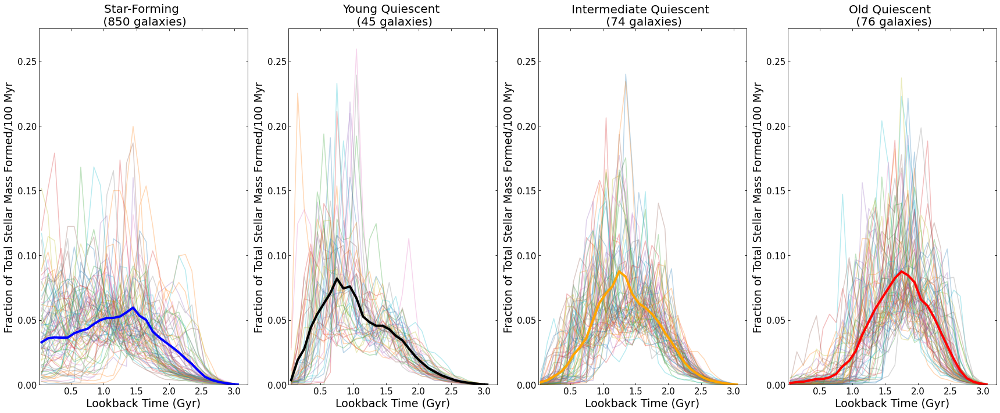

In [5]:
# SFH of all 4 galaxy classes
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')

redshift=2
binwidth=0.1 #Gyr

#panel 1: 80 star-forming galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
np.random.seed(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax1.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax1.plot(bincenters, SFH/np.sum(SFH), color = 'b', lw=4)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20)
ax1.set_xlim(0.01, 3.2)
ax1.set_ylim(0, 0.275)
ax1.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax1.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

#panel 2: young quiescent galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
for id in ids[PSB_selection]:
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax2.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax2.plot(bincenters, SFH/np.sum(SFH), color = 'k', lw=4)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20)
ax2.set_xlim(0.01, 3.2)
ax2.set_ylim(0, 0.275)
ax2.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax2.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

#panel 3: intermediate quiescent galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax3.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax3.plot(bincenters, SFH/np.sum(SFH), color = 'orange', lw=4)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20)
ax3.set_xlim(0.01, 3.2)
ax3.set_ylim(0, 0.275)
ax3.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax3.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

#panel 4: old quiescent galaxies
HistWeights = np.zeros(0)
LookbackTime = np.zeros(0)
for id in ids[old_quiescent_selection]:
    id_SFH = get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[1]
    ax4.plot(get_star_formation_history(id=id, redshift=redshift, plot=False, binwidth=binwidth)[0], id_SFH/np.sum(id_SFH), alpha = 0.3)
    stellar_data = get_galaxy_particle_data(id=id , redshift=redshift, populate_dict=True)
    HistWeights = np.concatenate((HistWeights, stellar_data['stellar_initial_masses']), axis = None) #units: logMsol/yr
    LookbackTime = np.concatenate((LookbackTime, stellar_data['LookbackTime']), axis = None)
SFH, BE = np.histogram(LookbackTime, bins=np.arange(0, max(LookbackTime), binwidth), weights=HistWeights, density = True)
bincenters = [(BE[i]+BE[i+1])/2. for i in range(len(BE)-1)]
ax4.plot(bincenters, SFH/np.sum(SFH), color = 'red', lw=4)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.01, 3.2)
ax4.set_ylim(0, 0.275)
ax4.set_xlabel("Lookback Time (Gyr)", fontsize=19)
ax4.set_ylabel("Fraction of Total Stellar Mass Formed/100 Myr", fontsize=19)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)

f.tight_layout()
#f.show()
#Note that the sum of the histogram values will not be equal to 1 unless bins of unity width are chosen; 
#it is not a probability mass function.

# [Z]

### Figure 3

Radial metallicity profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

[0.00000000e+00 1.57439999e-01 2.12183491e-01 2.54279501e-01
 2.89692739e-01 3.21685884e-01 3.51862371e-01 3.80496740e-01
 4.08357492e-01 4.35830049e-01 4.63064379e-01 4.90359574e-01
 5.18115369e-01 5.46125619e-01 5.74723625e-01 6.04248888e-01
 6.34810581e-01 6.66429234e-01 6.99529853e-01 7.34558475e-01
 7.71577925e-01 8.11055729e-01 8.53819467e-01 9.00180610e-01
 9.50841347e-01 1.00690316e+00 1.07023708e+00 1.14319146e+00
 1.22859014e+00 1.33060185e+00 1.45434440e+00 1.60391020e+00
 1.78295852e+00 2.00072879e+00 2.26575244e+00 2.58336677e+00
 2.96479968e+00 3.41622488e+00 3.94356565e+00 4.55483587e+00
 5.27677208e+00 6.16556522e+00 7.29923660e+00 8.81213029e+00
 1.09313666e+01 1.41123649e+01 1.91168453e+01 2.70152970e+01
 3.97304111e+01 6.92086656e+01 8.68943678e+02]


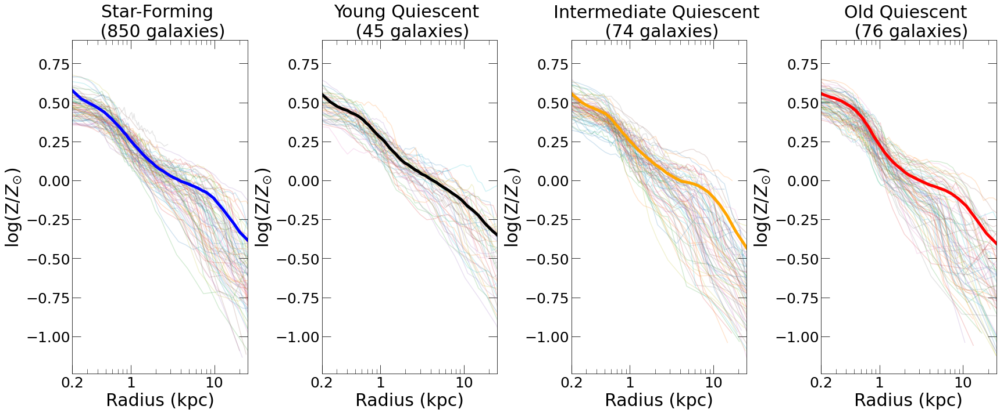

In [8]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
fts = 30
ftss = 25

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='blue', linewidth=5, label='median')

# fit line to star-forming galaxies
# def func(x, a, b, c):
#     return a*np.log10(x+b) + c
# popt, pcov = curve_fit(func, radial_percentiles[1:], statistic)
# label = str(popt[0]) + '*log(x+' + str(popt[1]) + ') + ' + str(popt[2])
# ax1.plot(np.array(radial_percentiles[1:]), np.log10(func(radial_percentiles[1:], *popt)), 'b--', linewidth=2, label=label)
# ax1.legend()

ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.24, 0.9)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.24, 0.9)
ax2.set_xlabel("Radius (kpc)", fontsize=fts)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax3.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(-1.24, 0.9)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
print(radial_percentiles)
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.24, 0.9)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('FIGURES\Zprofile.png', dpi=400)

### Figure 4

The metallicity profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

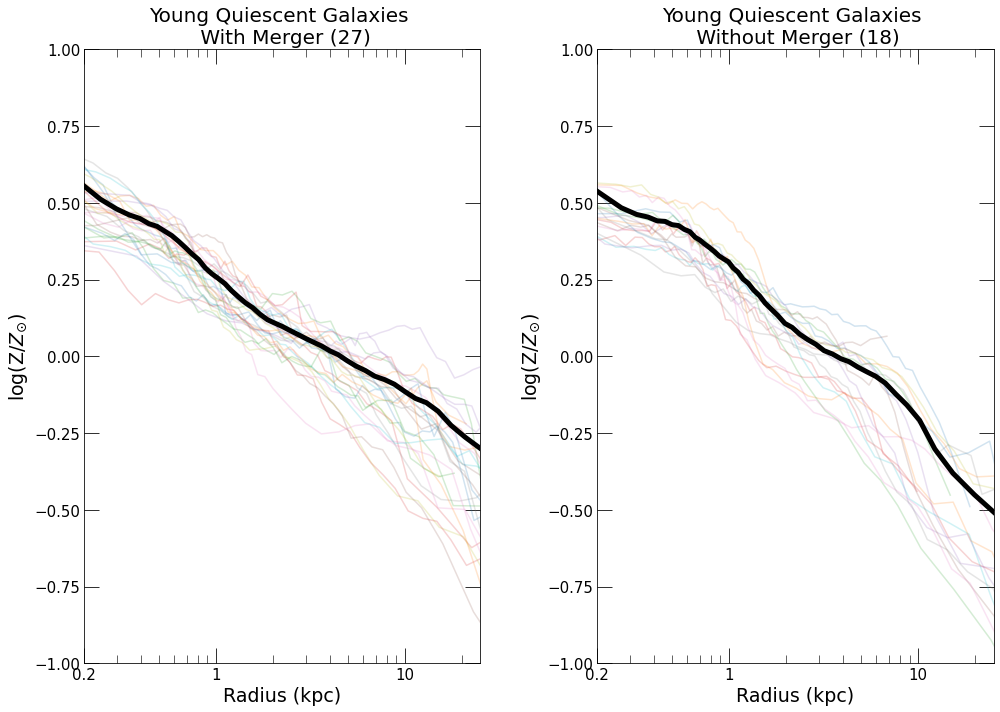

In [4]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.0, 1.0)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins)
    big_metallicity = np.concatenate((big_metallicity, metallicity), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.0, 1.0)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Fe/H]

### Figure 3

Radial [Fe/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

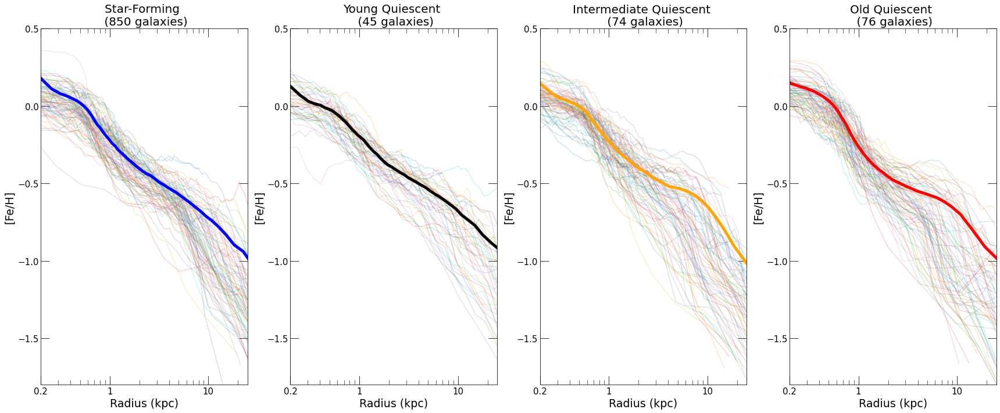

In [6]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.8, 0.5)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.8, 0.5)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(-1.8, 0.5)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Fe/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(-1.8, 0.5)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Fe/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Fe/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

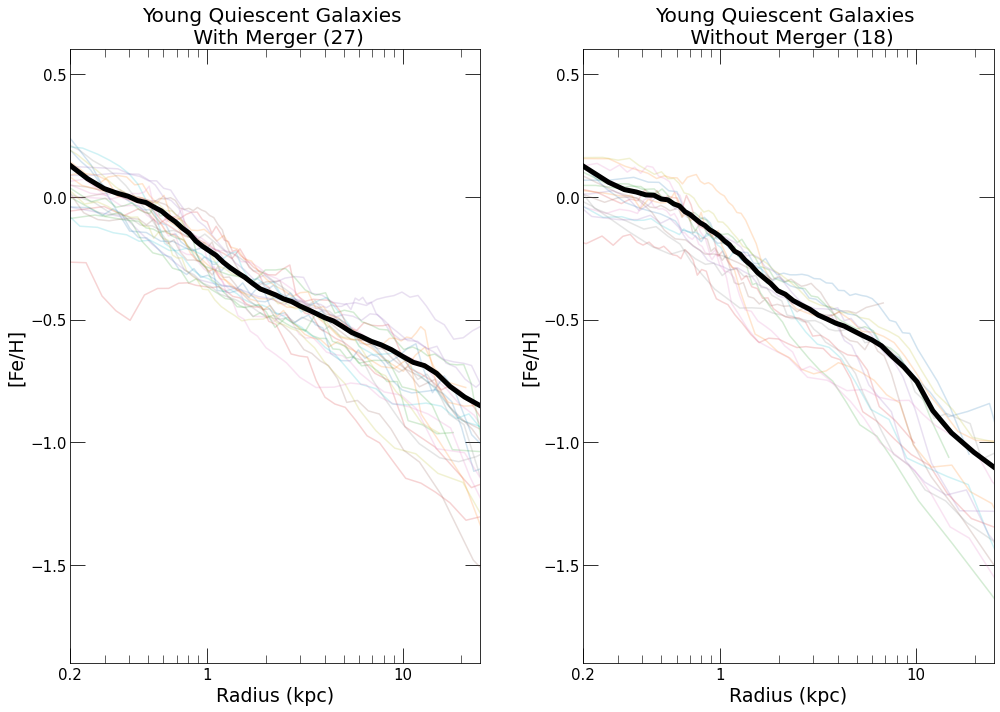

In [4]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(-1.9, 0.6)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(-1.9, 0.6)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Mg/Fe]

### Figure 3

Radial [Mg/Fe] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

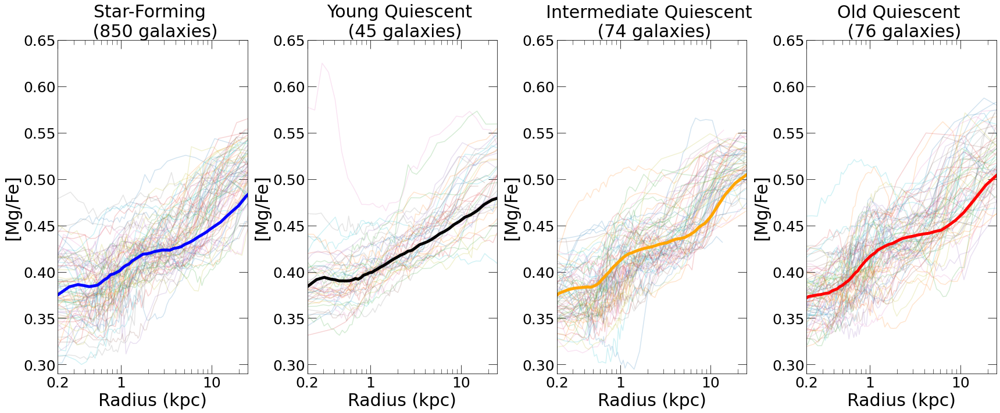

In [9]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = 0.29
ymax = 0.65
fts = 30
ftss = 25

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=fts) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=fts)
ax1.set_ylabel('[Mg/Fe]', fontsize=fts)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=fts) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=fts)
ax2.set_ylabel('[Mg/Fe]', fontsize=fts)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=fts) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=fts)
ax3.set_ylabel('[Mg/Fe]', fontsize=fts)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=fts)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=fts)
ax4.set_ylabel('[Mg/Fe]', fontsize=fts)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=ftss, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

plt.savefig('FIGURES/MgFeprofile.png', dpi=400)

### Figure 4

The [Mg/Fe] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

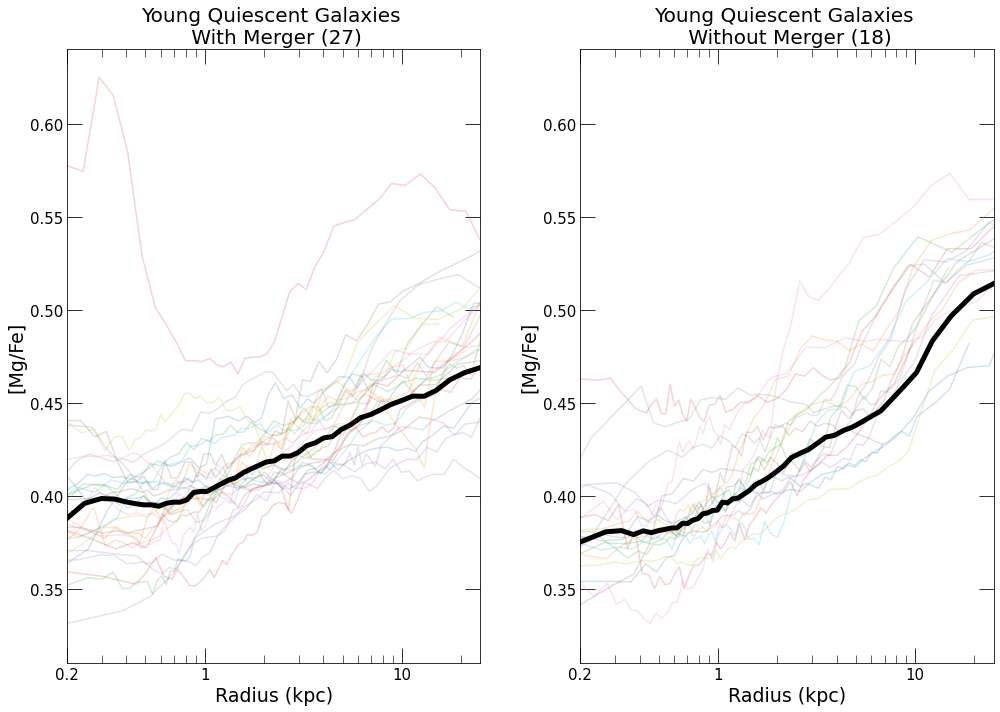

In [8]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = 0.31
ymax = 0.64

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Mg/H]

### Figure 3

Radial [Mg/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

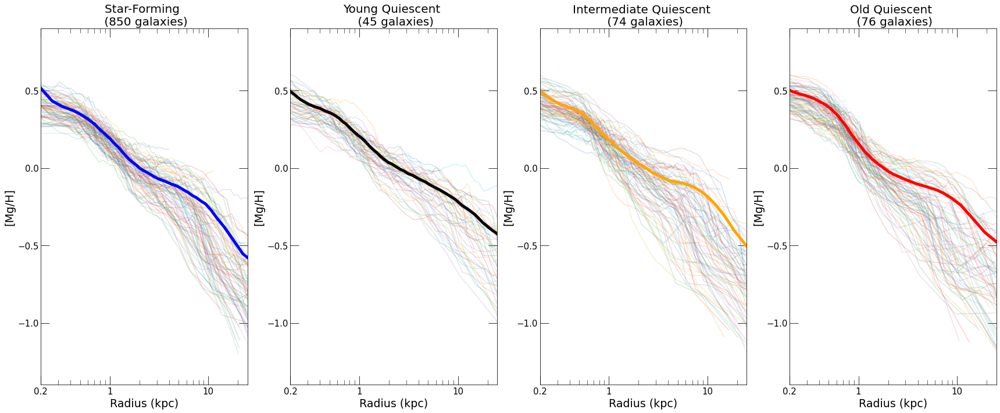

In [16]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.4
ymax = 0.9

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Mg/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Mg/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Mg/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

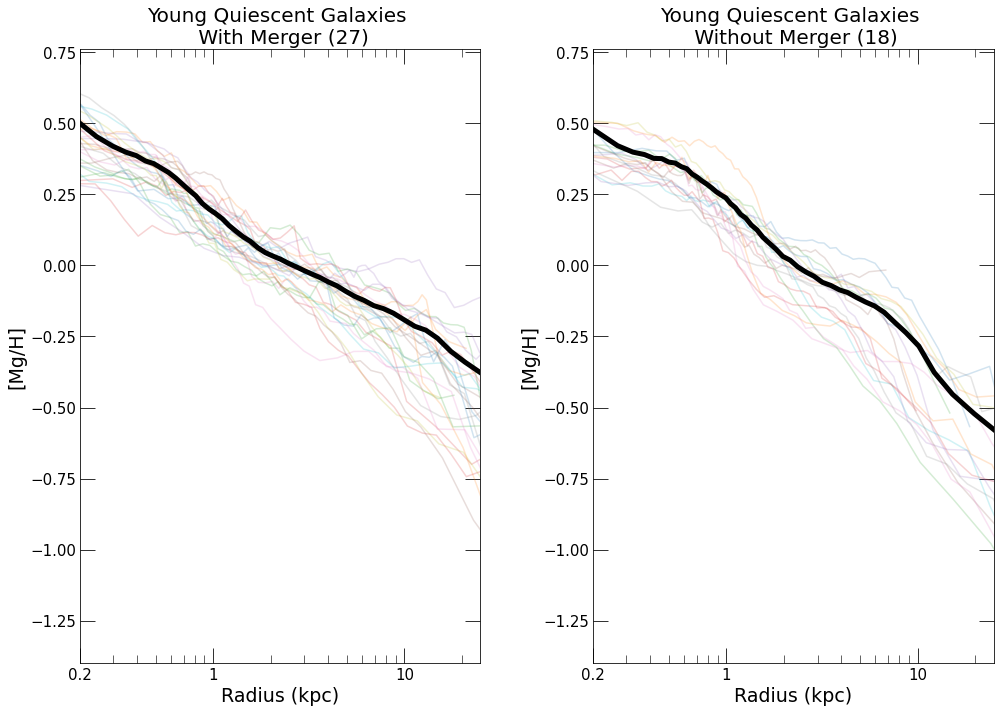

In [17]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.4
ymax = 0.76

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [O/Fe]

### Figure 3

Radial [O/Fe] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

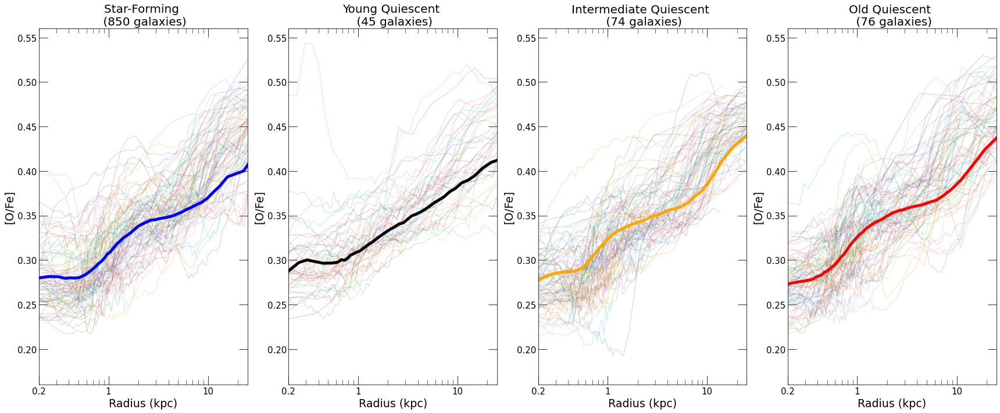

In [4]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = 0.16
ymax = 0.56

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[O/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[O/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[O/Fe]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[O/Fe]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [O/Fe] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

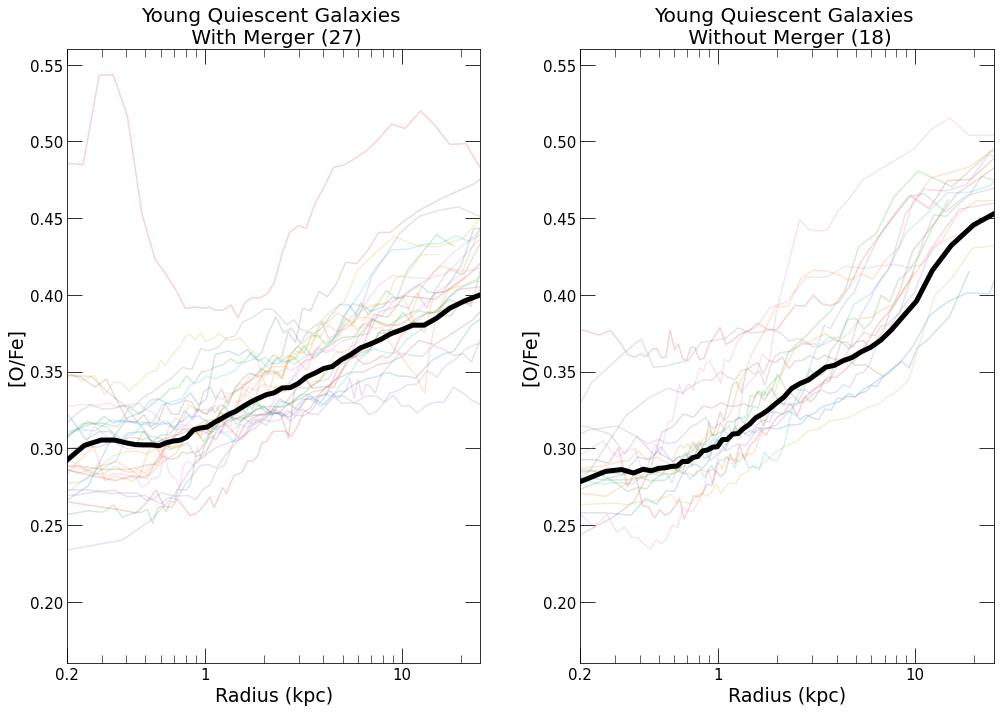

In [5]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = 0.16
ymax = 0.56

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[O/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='oxygen', den='iron')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[O/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Si/O]

### Figure 3

Radial [Si/O] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

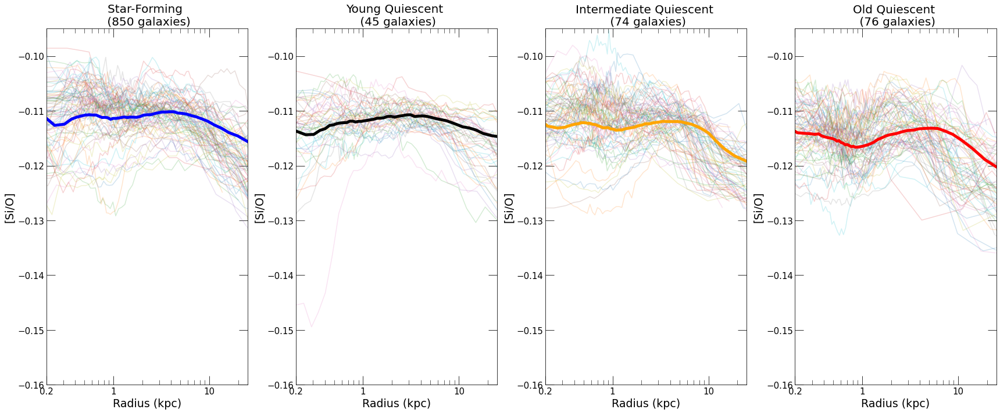

In [8]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -0.16
ymax = -0.095

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Si/O]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Si/O]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Si/O]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Si/O]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Si/O] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

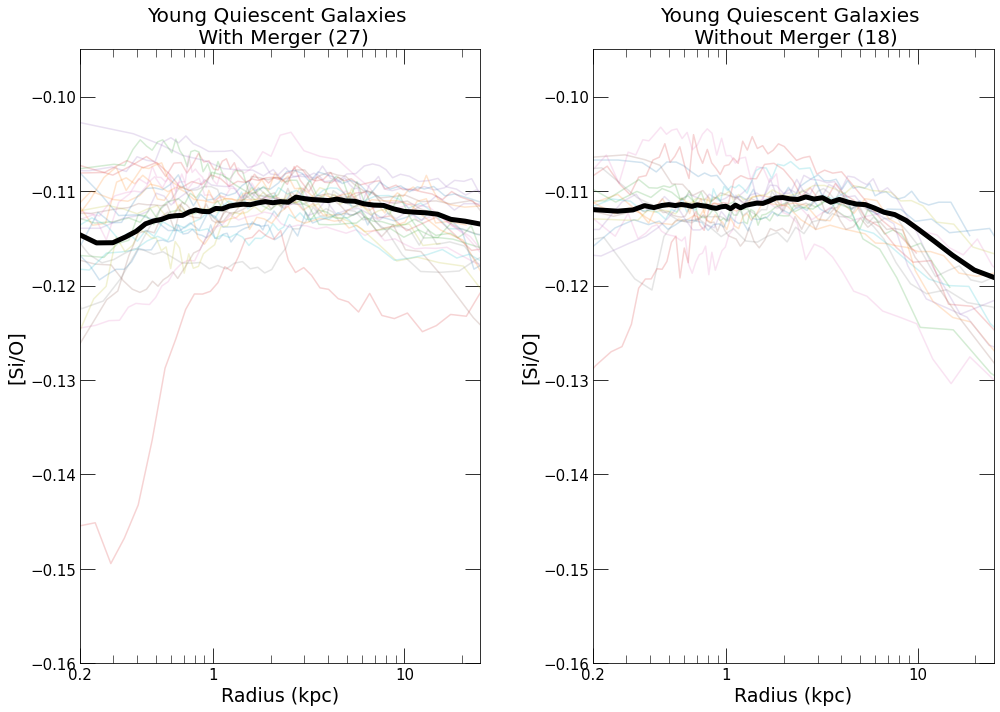

In [9]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -0.16
ymax = -0.095

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Si/O]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='silicon', den='oxygen')
    big_metallicity = np.concatenate((big_metallicity, logFeH), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, R), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Si/O]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Z] (luminosity-weighted)

### Figure 3

Radial metallicity profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

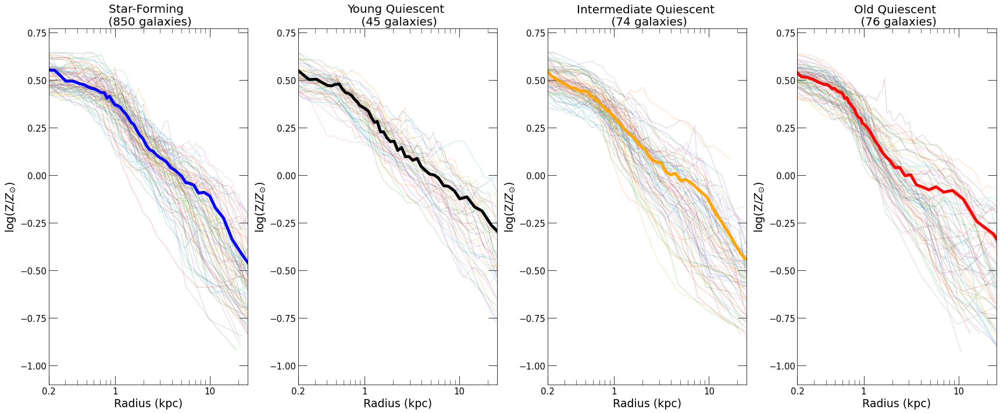

In [5]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.1
ymax = 0.77

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The metallicity profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

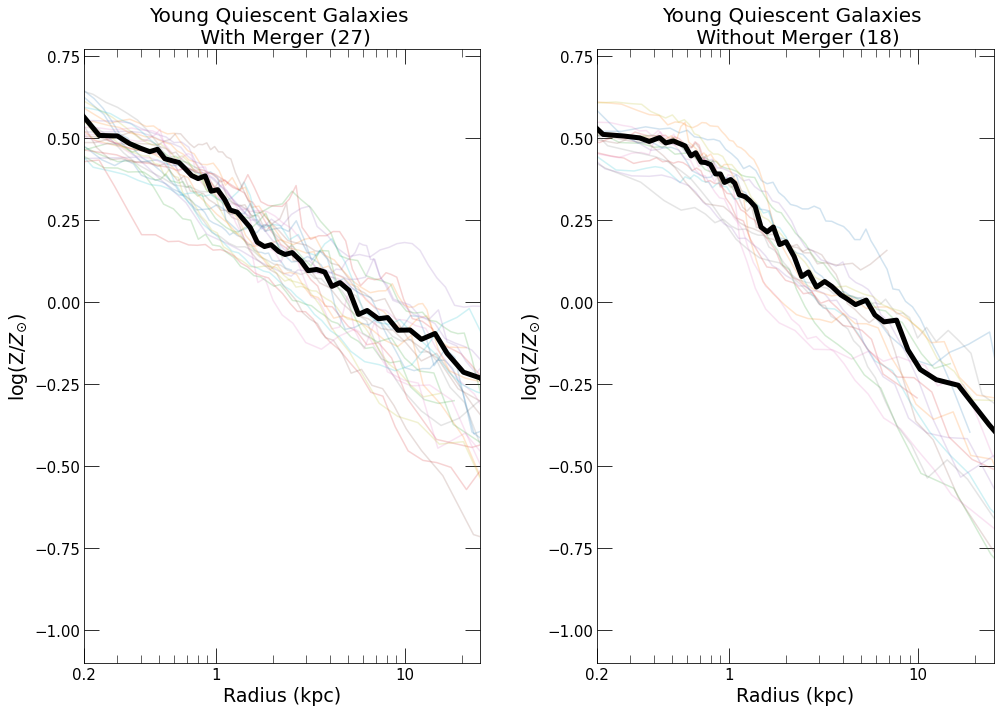

In [6]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.1
ymax = 0.77

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, xx, R, metallicity = metallicity_profile(id=id, redshift=redshift, n_bins=n_bins, profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, np.log10(yy), alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.log10(np.array(statistic)), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('log(Z/$Z_{\odot}$)', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Mg/Fe] (luminosity-weighted)

### Figure 3

Radial [Mg/Fe] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

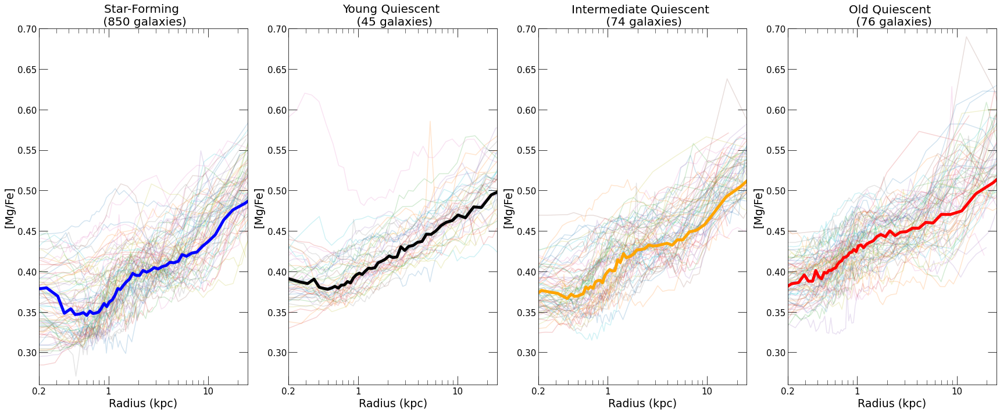

In [7]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = 0.26
ymax = 0.7

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) 
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Mg/Fe]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Mg/Fe]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Mg/Fe] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

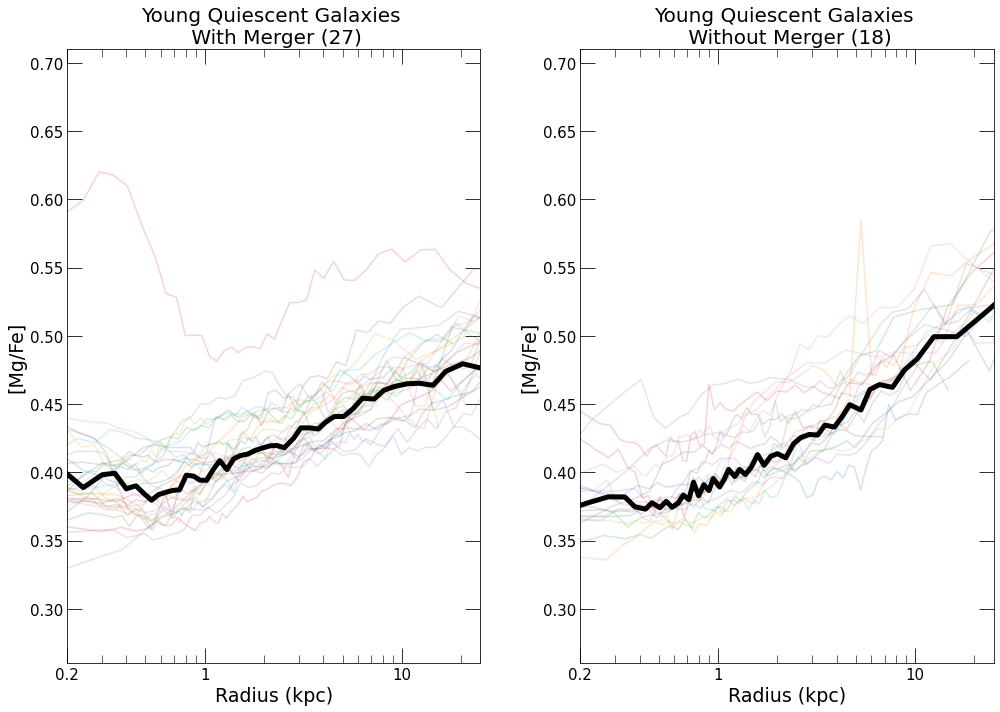

In [8]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = 0.26
ymax = 0.71

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/Fe]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='iron', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/Fe]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Fe/H] (luminosity-weighted)

### Figure 3

Radial [Fe/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

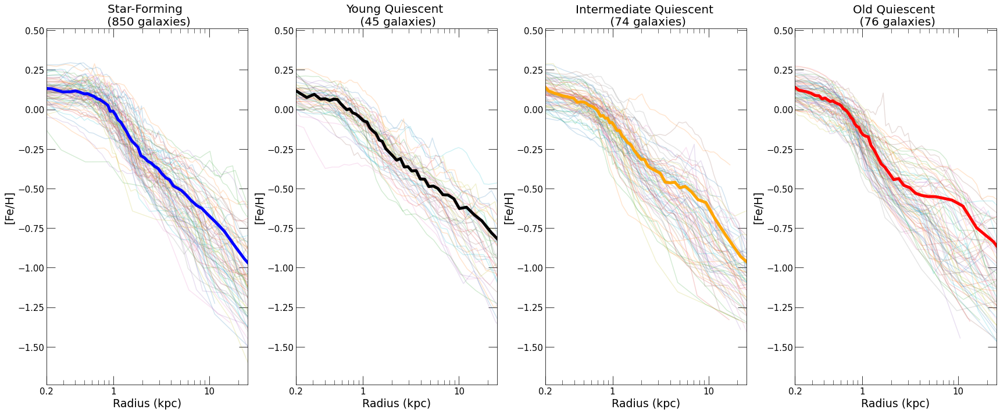

In [11]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.74
ymax = 0.51

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Fe/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Fe/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Fe/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

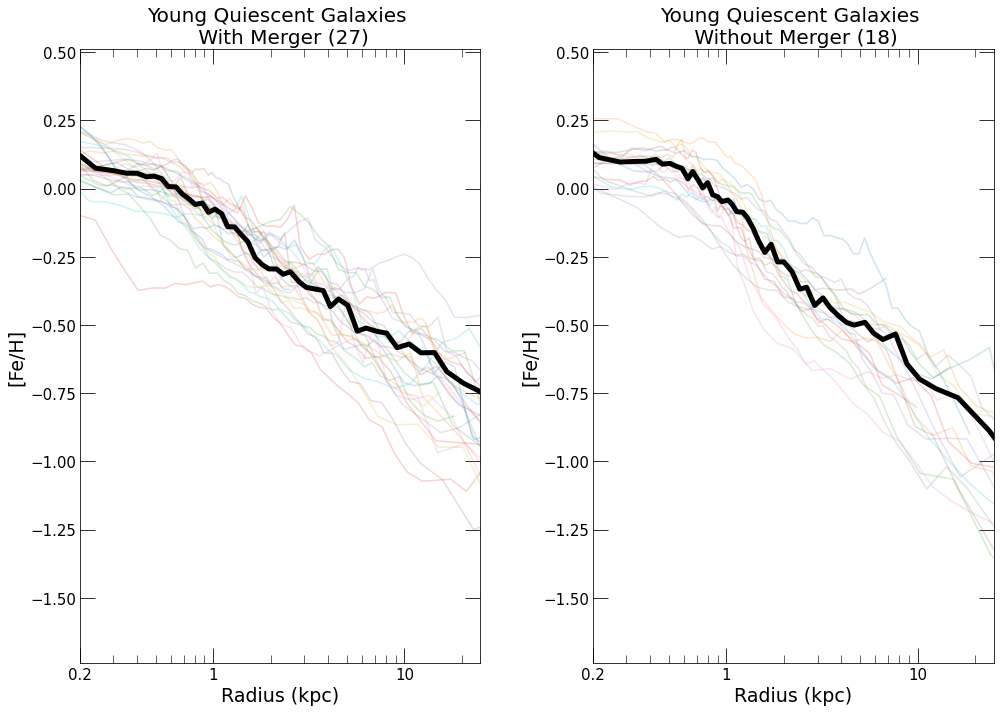

In [10]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.74
ymax = 0.51

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Fe/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='iron', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Fe/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)

# [Mg/H]

### Figure 3

Radial [Mg/H] profiles for the four galaxy populations (thin lines). For the star-forming population we only show 80 randomly drawn galaxies, for clarity. The running median for each population is shown in thick unbroken lines.

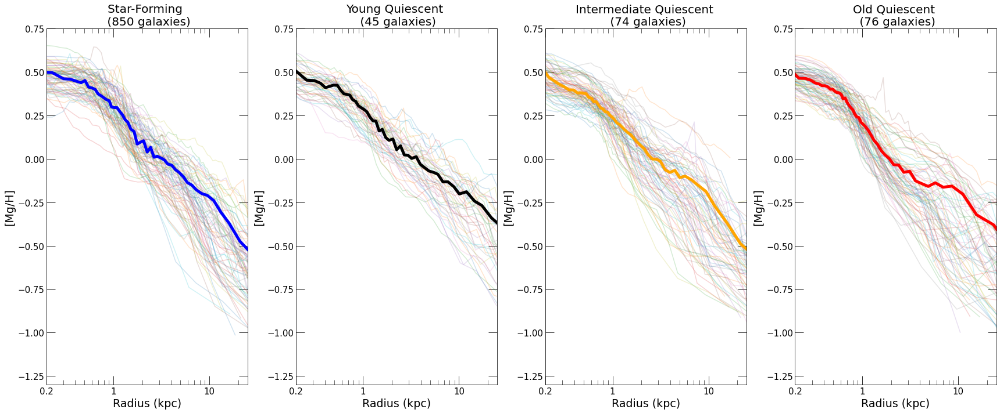

In [15]:
#metallicity profiles
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='none', sharey='none', figsize=(24, 10))
f.set_facecolor('w')
n_bins = 50
redshift = 2
ymin = -1.3
ymax = 0.75

#z=2 star-forming galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in np.random.choice(ids[starforming_selection], 80, replace=False):
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='blue', linewidth=5)
ax1.set_title('Star-Forming \n ('+str(len(ids[starforming_selection]))+' galaxies)', fontsize=20) #
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#z=2 young quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent \n ('+str(len(ids[PSB_selection]))+' galaxies)', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

#z=2 intermediate quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[intermediate_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax3.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax3.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='orange', linewidth=5)
ax3.set_title('Intermediate Quiescent \n ('+str(len(ids[intermediate_quiescent_selection]))+' galaxies)', fontsize=20) #
ax3.set_xlim(0.2, 25)
ax3.set_ylim(ymin, ymax)
ax3.set_xlabel("Radius (kpc)", fontsize=19)
ax3.set_ylabel('[Mg/H]', fontsize=19)
ax3.set_xscale('log')
ax3.tick_params(which='major', length=15)
ax3.tick_params(which='minor', length=8)
ax3.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax3.set_xticks([0.2, 1, 10], minor=False)
ax3.set_xticklabels(['0.2', '1', '10'])

#z=2 old quiescent galaxies
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[old_quiescent_selection]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax4.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax4.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='red', linewidth=5)
ax4.set_title('Old Quiescent \n ('+str(len(ids[old_quiescent_selection]))+' galaxies)', fontsize=20)
ax4.set_xlim(0.2, 25)
ax4.set_ylim(ymin, ymax)
ax4.set_xlabel("Radius (kpc)", fontsize=19)
ax4.set_ylabel('[Mg/H]', fontsize=19)
ax4.set_xscale('log')
ax4.tick_params(which='major', length=15)
ax4.tick_params(which='minor', length=8)
ax4.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax4.set_xticks([0.2, 1, 10], minor=False)
ax4.set_xticklabels(['0.2', '1', '10'])

f.tight_layout()

### Figure 4

The [Mg/H] profiles of young quiescent galaxies, with separate panels for galaxies with at least one significant merger that contributes at least $10\%$ of the $z=2$ stellar mass (with mergers: left panel) and those without such a merger (right panel).

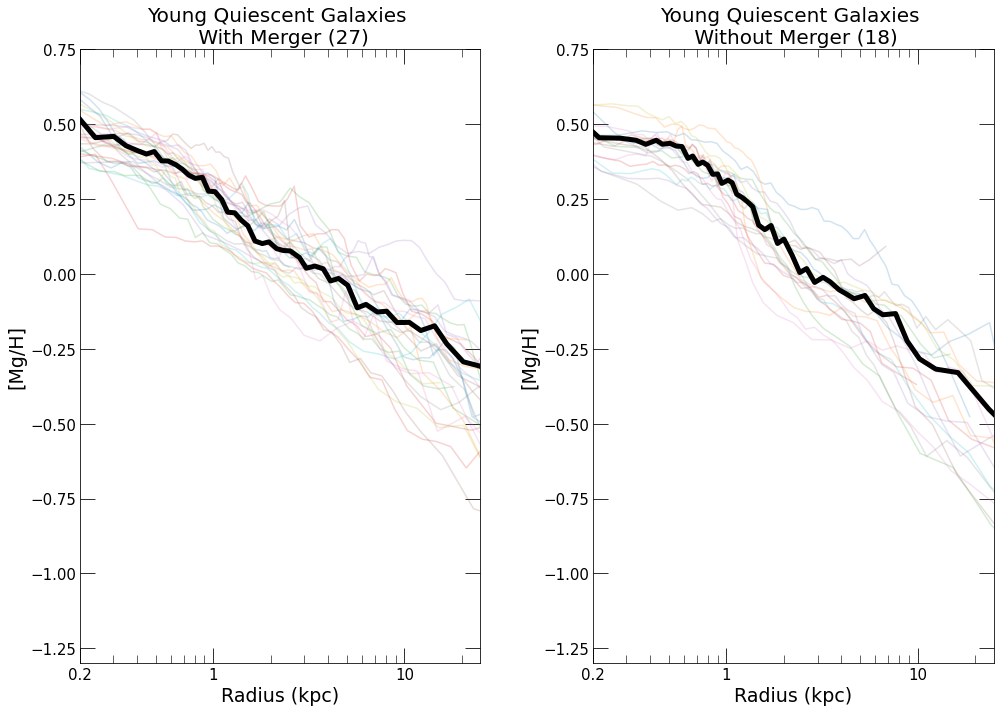

In [16]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(14, 10))
f.set_facecolor('w')
n_bins=50
redshift=2
ymin = -1.3
ymax = 0.75

#select young quiescent galaxies by merger cut-off
# had a significant prior merger 
PSB = (maximum_merger_ratio_30kpc_current_fraction>=0.1) & PSB_selection 
# had no significant prior merger
PSBm = (maximum_merger_ratio_30kpc_current_fraction<0.1) & PSB_selection 

#panel 1: young quiescent galaxies with mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSB]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax1.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax1.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax1.set_title('Young Quiescent Galaxies \n With Merger ('+str(len(ids[PSB]))+')', fontsize=20)
ax1.set_xlim(0.2, 25)
ax1.set_ylim(ymin, ymax)
ax1.set_xlabel("Radius (kpc)", fontsize=19)
ax1.set_ylabel('[Mg/H]', fontsize=19)
ax1.set_xscale('log')
ax1.tick_params(which='major', length=15)
ax1.tick_params(which='minor', length=8)
ax1.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax1.set_xticks([0.2, 1, 10], minor=False)
ax1.set_xticklabels(['0.2', '1', '10'])

#panel 2: young quiescent galaxies without mergers
distance = np.zeros(0)
big_metallicity = np.zeros(0)
for id in ids[PSBm]:
    yy, logFeH, xx, R = metals_profile(id=id, redshift=redshift, n_bins=n_bins, num='magnesium', den='hydrogen', profile='mean', weight='luminosity')
    big_metallicity = np.concatenate((big_metallicity, yy), axis = None)
    ax2.plot(xx, yy, alpha = 0.2)
    distance = np.concatenate((distance, xx), axis = None)
radial_percentiles = np.zeros(n_bins + 1) #N+1 for N percentiles 
for i in range(1, (n_bins+1)):
    radial_percentiles[i] = np.percentile(distance, (100/n_bins)*i) 
statistic, bin_edges, bin_number = scipy.stats.binned_statistic(distance, big_metallicity, 'median', bins=radial_percentiles)
ax2.plot(np.array(radial_percentiles[1:]), np.array(statistic), c='black', linewidth=5)
ax2.set_title('Young Quiescent Galaxies \n Without Merger ('+str(len(ids[PSBm]))+')', fontsize=20) #
ax2.set_xlim(0.2, 25)
ax2.set_ylim(ymin, ymax)
ax2.set_xlabel("Radius (kpc)", fontsize=19)
ax2.set_ylabel('[Mg/H]', fontsize=19)
ax2.set_xscale('log')
ax2.tick_params(which='major', length=15)
ax2.tick_params(which='minor', length=8)
ax2.tick_params(direction='in', which='both', labelsize=15, bottom=True, top=True, left=True, right=True)
ax2.set_xticks([0.2, 1, 10], minor=False)
ax2.set_xticklabels(['0.2', '1', '10'])

f.tight_layout(w_pad=4, h_pad=10)